# Load modules

In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import random
import GPy
from scipy.special import erf
from scipy.stats import norm
import scipy.optimize
import sys
from math import pi
from ipywidgets import interact
import pymech as pm
from pymech.neksuite import readnek
from pymech.neksuite import writenek
import copy
from tqdm import tqdm
from matplotlib.animation import FuncAnimation
from matplotlib import rc
from sklearn.linear_model import Lasso
from scipy.interpolate import interp1d

import matplotlib.pylab as plt
from matplotlib import rc
from matplotlib import rcParams
from matplotlib.animation import FuncAnimation
import matplotlib.ticker as tick


background_color_list = ['#2f2f2f','white']
axis_color_list = ['#2f2f2f','white','black','#a6a6a6']
support_line_list = ['#2f2f2f','white','black']
ib  = 1
ia  = 2
isp = 2
rcParams['text.usetex'] = True
rcParams['lines.linewidth'] = 1.5
rcParams['font.size'] = 16
rcParams['axes.facecolor'] = background_color_list[ib]
rcParams['axes.edgecolor'] = axis_color_list[ia]
rcParams['axes.labelcolor'] = axis_color_list[ia]
rcParams['xtick.color'] = axis_color_list[ia]
rcParams['ytick.color'] = axis_color_list[ia]



from tqdm import tqdm

# Open file

In [2]:
# Open file

filename="tbl_data.hdf5"
f = h5py.File(filename, "r")

# Read attributes
print('Attributes:')
print(list(f.attrs))
dstar = f.attrs['dstar']
nplanes = int(f.attrs['nplanes'])
nx = int(f.attrs['nx'])
ny = int(f.attrs['ny'])
nz = int(f.attrs['nz'])
re = f.attrs['re']
xl = f.attrs['xl']
zl = f.attrs['zl']

# Read data sets
print('Keys:')
print(list(f.keys()))
uzy = f['u']
uzy = np.transpose(uzy, (1, 0, 2))
vzy = f['v']
vzy = np.transpose(vzy, (1, 0, 2))
wzy = f['w']
wzy = np.transpose(wzy, (1, 0, 2))
time = f['t']

f.close()



Attributes:
['dstar', 'nplanes', 'nx', 'ny', 'nz', 're', 'xl', 'zl']
Keys:
['t', 'u', 'v', 'w']


In [3]:
#Do the scaling
xl=xl/dstar
yl=2/dstar
zl=zl/dstar

#Grid
x=xl/nx*np.arange(0,nx)

#ny=int(ny)
y=np.zeros(ny)
for i in range(ny):
    y[i]=np.cos(np.pi*i/(ny-1))*yl/2


z=zl/nz*np.arange(0,nz)-zl/2


[yy,zz] = np.meshgrid(y,z);

In [4]:
cmapp='RdBu_r'
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)

def update(iteration):
    #plt.scatter(zz[0:-1:10,0:-1:10],yy[0:-1:10,0:-1:10])
    ax.contourf(zz,yy,uzy[:,:,iteration],levels=100,cmap=cmapp)
    #plt.xlabel(r'$z$')
    #plt.ylabel(r'$y$')
    fig.tight_layout()

num_iterations = 10
anim = FuncAnimation(fig, update, frames=np.arange(0, num_iterations, 1), interval=200)
plt.close()

rc('animation', html='jshtml')
anim

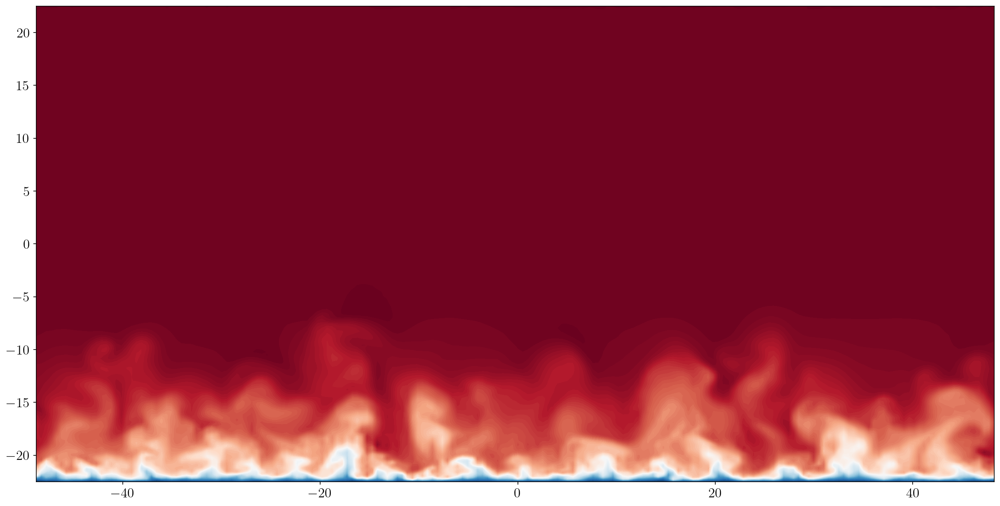

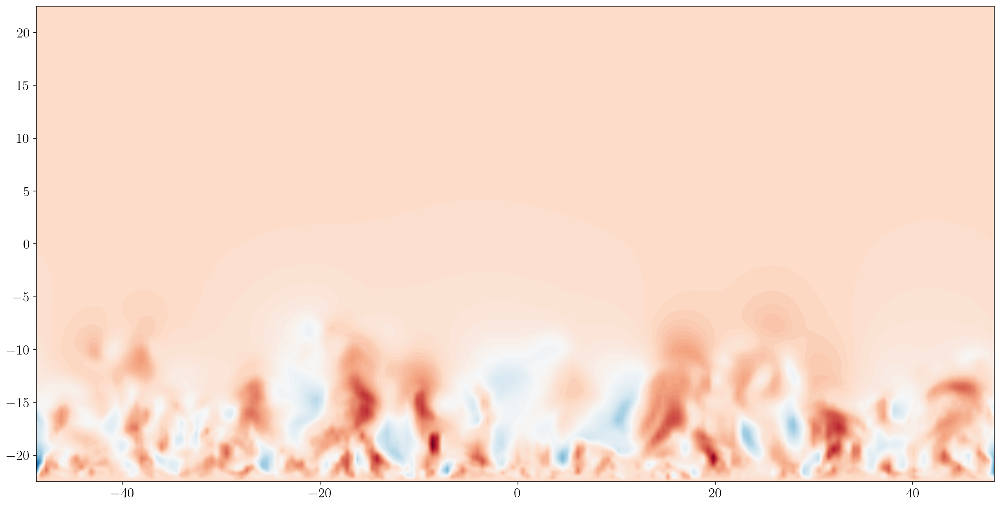

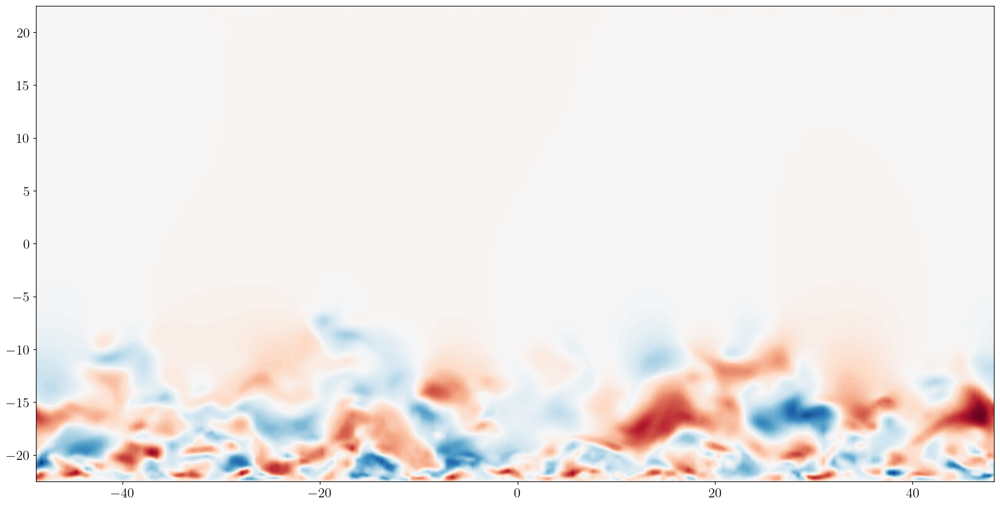

In [5]:
cmapp='RdBu_r'

#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz,yy,uzy[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz,yy,vzy[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz,yy,wzy[:,:,0],levels=100,cmap=cmapp)
plt.show()

## Interpolate to an equidistant mesh

In [6]:
y_eq=yl/ny*np.arange(ny,0,-1)-yl/2

uzy_eq=np.zeros(uzy.shape)
vzy_eq=np.zeros(vzy.shape)
wzy_eq=np.zeros(wzy.shape)


z_ind=0
t_ind=0

pbar=tqdm(total=uzy.shape[2])
for t_ind in range(0,uzy.shape[2]):
#for t_ind in range(0,3):
    for z_ind in range(0,uzy.shape[0]):
        set_interp = interp1d(y, uzy[z_ind,:,t_ind])
        uzy_eq[z_ind,:,t_ind] = set_interp(y_eq)
        
        set_interp = interp1d(y, vzy[z_ind,:,t_ind])
        vzy_eq[z_ind,:,t_ind] = set_interp(y_eq)
        
        set_interp = interp1d(y, wzy[z_ind,:,t_ind])
        wzy_eq[z_ind,:,t_ind] = set_interp(y_eq)
    pbar.update(1)
pbar.close()

100%|████████████████████████████████| 22900/22900 [30:09<00:00, 12.65it/s]


In [7]:
[yy_eq,zz_eq] = np.meshgrid(y_eq,z)

cmapp='RdBu_r'
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)

def update(iteration):
    #plt.scatter(zz[0:-1:10,0:-1:10],yy[0:-1:10,0:-1:10])
    ax.contourf(zz_eq,yy_eq,uzy_eq[:,:,iteration],levels=100,cmap=cmapp)
    #plt.xlabel(r'$z$')
    #plt.ylabel(r'$y$')
    fig.tight_layout()

num_iterations = 10
anim = FuncAnimation(fig, update, frames=np.arange(0, num_iterations, 1), interval=200)
plt.close()

rc('animation', html='jshtml')
anim

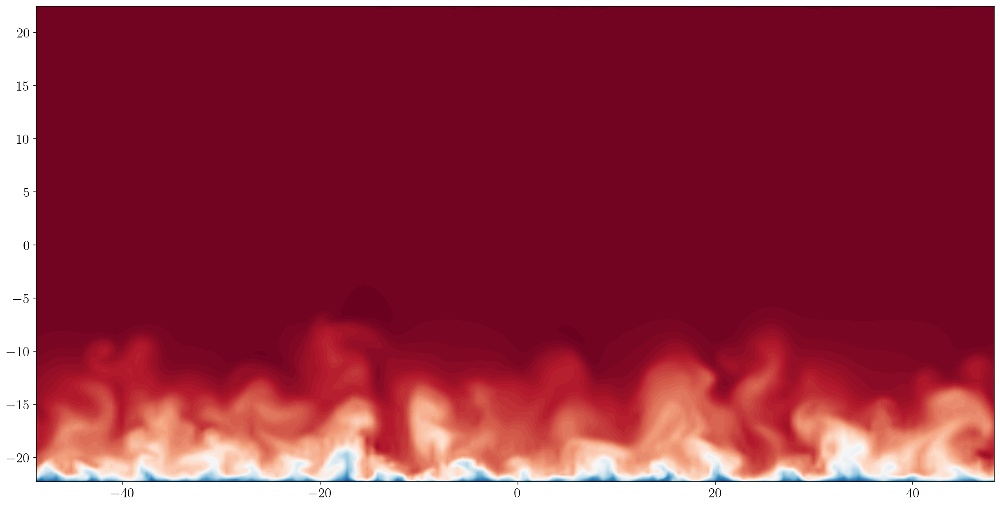

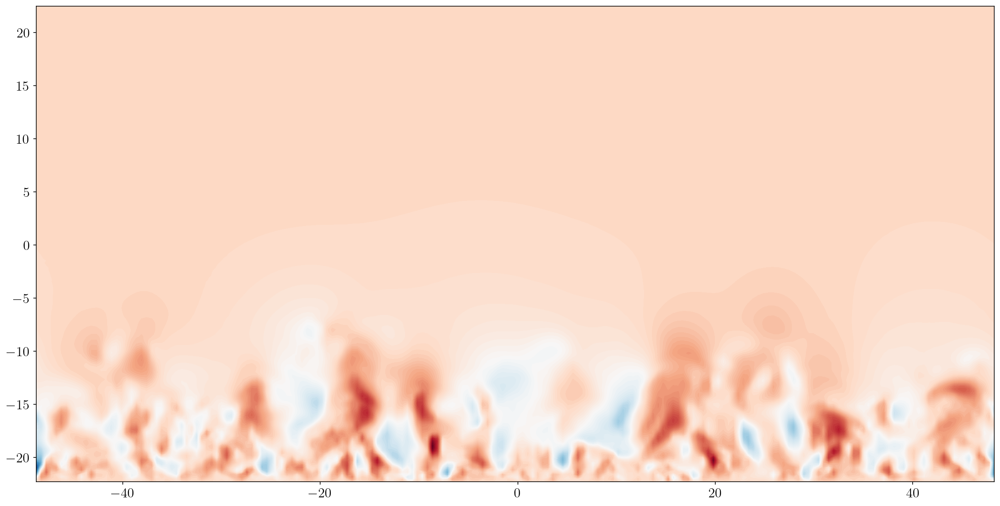

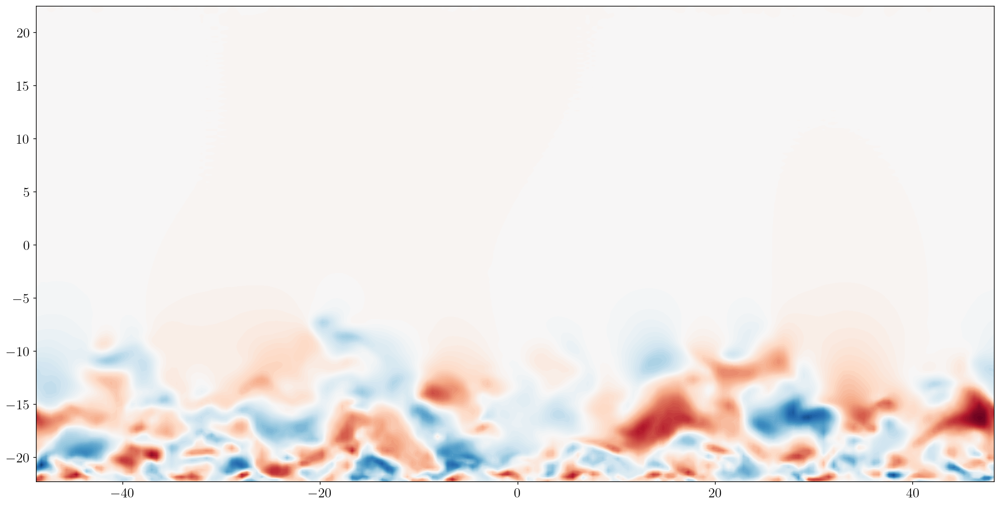

In [8]:
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_eq,yy_eq,uzy_eq[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_eq,yy_eq,vzy_eq[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_eq,yy_eq,wzy_eq[:,:,0],levels=100,cmap=cmapp)
plt.show()

## Subsample the data set

In [9]:
ny_sub=64
nz_sub=64

sub_mode='full_domain'

if sub_mode == 'full_domain':

    #y_sub=yl/ny_sub*np.arange(ny_sub,0,-1)-yl/2
    #z_sub=zl/nz_sub*np.arange(nz_sub,0,-1)-zl/2
    y_sub=yl/ny_sub*np.arange(ny_sub,0,-1)-yl/2
    z_sub=np.linspace(z[0],z[-1],nz_sub)
        
    uzy_sub=np.zeros((nz_sub,ny_sub,uzy.shape[2]))
    vzy_sub=np.zeros((nz_sub,ny_sub,vzy.shape[2]))
    wzy_sub=np.zeros((nz_sub,ny_sub,wzy.shape[2]))

    tempu=np.zeros((nz,ny_sub,1))
    tempv=np.zeros((nz,ny_sub,1))
    tempw=np.zeros((nz,ny_sub,1))

    z_ind=0
    y_ind=0
    t_ind=0
        
    pbar=tqdm(total=uzy.shape[2])
    for t_ind in range(0,uzy.shape[2]):
    #for t_ind in range(0,3):
        for z_ind in range(0,uzy_eq.shape[0]):
            set_interp = interp1d(y_eq, uzy_eq[z_ind,:,t_ind])
            tempu[z_ind,:,0] = set_interp(y_sub)
            
            set_interp = interp1d(y_eq, vzy_eq[z_ind,:,t_ind])
            tempv[z_ind,:,0] = set_interp(y_sub)
            
            set_interp = interp1d(y_eq, wzy_eq[z_ind,:,t_ind])
            tempw[z_ind,:,0] = set_interp(y_sub)
            
        for y_ind in range(0,uzy_sub.shape[1]):
            set_interp = interp1d(z, tempu[:,y_ind,0])
            uzy_sub[:,y_ind,t_ind] = set_interp(z_sub)

            set_interp = interp1d(z, tempv[:,y_ind,0])
            vzy_sub[:,y_ind,t_ind] = set_interp(z_sub)

            set_interp = interp1d(z, tempw[:,y_ind,0])
            wzy_sub[:,y_ind,t_ind] = set_interp(z_sub)

            
            
        pbar.update(1)
    pbar.close()
    
    
else:

    y_sub=y_eq[-ny_sub-1:-1]
    z_sub=z[:nz_sub]

    uzy_sub=np.zeros((nz_sub,ny_sub,uzy.shape[2]))
    vzy_sub=np.zeros((nz_sub,ny_sub,vzy.shape[2]))
    wzy_sub=np.zeros((nz_sub,ny_sub,wzy.shape[2]))


    z_ind=0
    t_ind=0

    pbar=tqdm(total=uzy.shape[2])
    for t_ind in range(0,uzy.shape[2]):
        for z_ind in range(0,nz_sub):
            uzy_sub[z_ind,:,t_ind] = uzy_eq[z_ind,-ny_sub-1:-1,t_ind]
            vzy_sub[z_ind,:,t_ind] = vzy_eq[z_ind,-ny_sub-1:-1,t_ind]
            wzy_sub[z_ind,:,t_ind] = wzy_eq[z_ind,-ny_sub-1:-1,t_ind]

        pbar.update(1)
    pbar.close()

100%|████████████████████████████████| 22900/22900 [25:32<00:00, 14.94it/s]


In [10]:
[yy_sub,zz_sub] = np.meshgrid(y_sub,z_sub)

cmapp='RdBu_r'
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)

def update(iteration):
    #plt.scatter(zz[0:-1:10,0:-1:10],yy[0:-1:10,0:-1:10])
    c1=ax.contourf(zz_sub,yy_sub,uzy_sub[:,:,iteration],levels=100,cmap=cmapp)
    for c in c1.collections:
        c.set_edgecolor("face")
        c.set_rasterized(True)
    #plt.xlabel(r'$z$')
    #plt.ylabel(r'$y$')
    fig.tight_layout()

num_iterations = 10
anim = FuncAnimation(fig, update, frames=np.arange(0, num_iterations, 1), interval=200)
plt.close()

rc('animation', html='jshtml')
anim

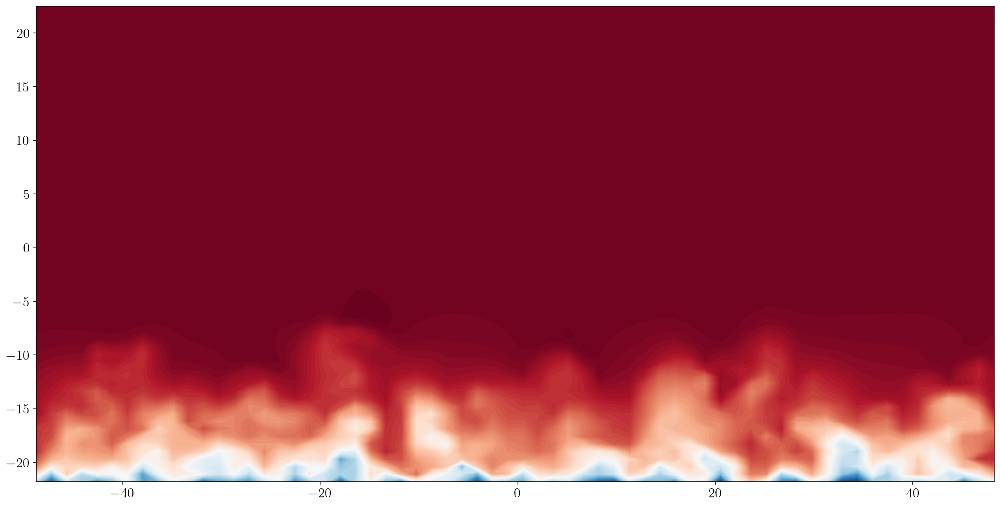

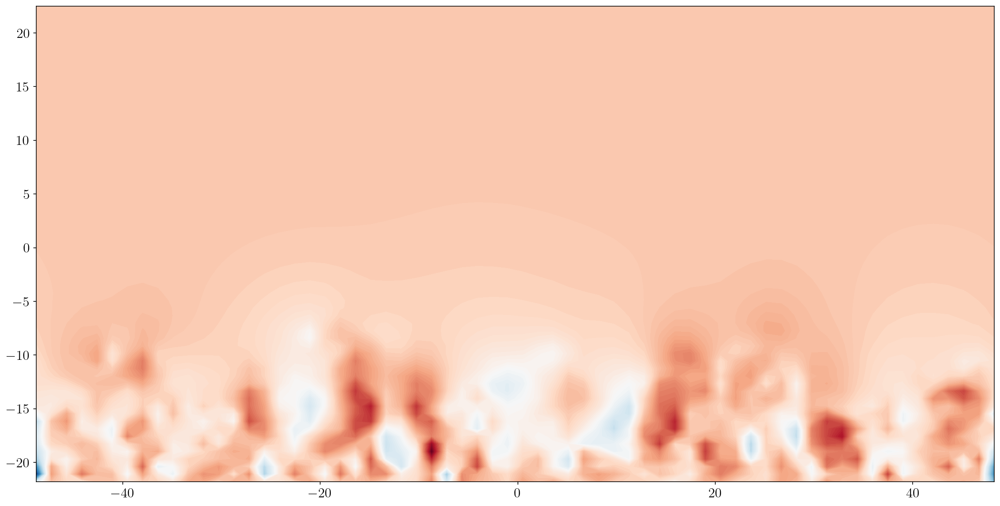

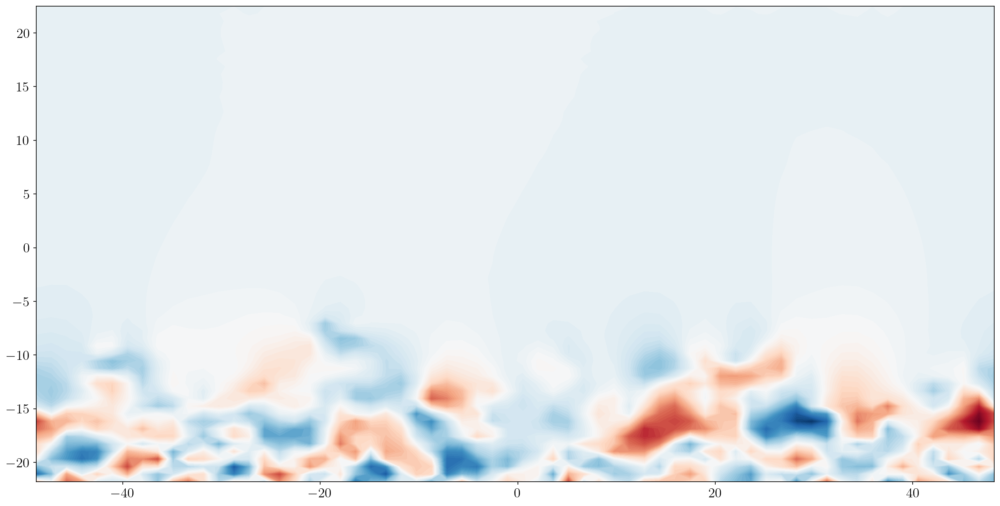

In [11]:
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,uzy_sub[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,vzy_sub[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,wzy_sub[:,:,0],levels=100,cmap=cmapp)
plt.show()

## Write a new data set

In [12]:
subsampled_filename='subsampled_TBL_data.hdf5'
fw = h5py.File(subsampled_filename,'w')

# Store some attributes
fw.attrs['dstar'] = dstar
fw.attrs['nplanes'] = nplanes
fw.attrs['nx'] = nx
fw.attrs['ny'] = ny_sub
fw.attrs['nz'] = nz_sub
fw.attrs['re'] = re
fw.attrs['xl'] = xl
fw.attrs['zl'] = zl

#Store the data sets
dset1 = fw.create_dataset('u',data=uzy_sub, compression="gzip", compression_opts=4)
dset2 = fw.create_dataset('v',data=vzy_sub, compression="gzip", compression_opts=4)
dset3 = fw.create_dataset('w',data=wzy_sub, compression="gzip", compression_opts=4)

dset4 = fw.create_dataset('y',data=y_sub, compression="gzip", compression_opts=4)
dset5 = fw.create_dataset('z',data=z_sub, compression="gzip", compression_opts=4)
#dset6 = fw.create_dataset('t',data=time, compression="gzip", compression_opts=4)


fw.close()

In [13]:
sys.exit(0)

SystemExit: 0

 C:\Users\adalb\anaconda3\envs\machine_learning\lib\site-packages\IPython\core\interactiveshell.py:3441: UserWarning:To exit: use 'exit', 'quit', or Ctrl-D.


## Read new data set

In [ ]:
# Open file
filename=subsampled_filename
f = h5py.File(filename, "r")

# Read attributes
print('Attributes:')
print(list(f.attrs))
dstar = f.attrs['dstar']
nplanes = int(f.attrs['nplanes'])
nx = int(f.attrs['nx'])
ny = int(f.attrs['ny'])
nz = int(f.attrs['nz'])
re = f.attrs['re']
xl = f.attrs['xl']
zl = f.attrs['zl']

# Read data sets
print('Keys:')
print(list(f.keys()))
uzy = f['u']
uzy = np.transpose(uzy, (0, 1, 2))
vzy = f['v']
vzy = np.transpose(vzy, (0, 1, 2))
wzy = f['w']
wzy = np.transpose(wzy, (0, 1, 2))

f.close()

In [ ]:
print(uzy.shape)

In [ ]:
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,uzy[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,vzy[:,:,0],levels=100,cmap=cmapp)
plt.show()

fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,wzy[:,:,0],levels=100,cmap=cmapp)
plt.show()

## Create torch data set

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

In [ ]:
f.close()


In [ ]:
class TBL_Dataset(Dataset):
    """Turbulent boundary layer dataset."""

    def __init__(self, filename, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """

        f = h5py.File(filename, "r")

        # Read attributes
        #print('Attributes:')
        #print(list(f.attrs))
        self.dstar = f.attrs['dstar']
        self.nplanes = int(f.attrs['nplanes'])
        self.nx = int(f.attrs['nx'])
        self.ny = int(f.attrs['ny'])
        self.nz = int(f.attrs['nz'])
        self.re = f.attrs['re']
        self.xl = f.attrs['xl']
        self.zl = f.attrs['zl']

        
        
        # Read data sets
        uzy = f['u']
        self.u = np.transpose(uzy, (0, 1, 2))
        vzy = f['v']
        self.v = np.transpose(vzy, (0, 1, 2))
        wzy = f['w']
        self.w = np.transpose(wzy, (0, 1, 2))
        self.y = f['y']
        self.z = f['z']
        #t = f['t']


        f.close()
        
        self.transform = transform

    def __len__(self):
        return self.u.shape[2]

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        field = np.zeros((self.u.shape[0],self.u.shape[1],3))
        field[:,:,0] = self.u[:,:,idx].reshape(self.u.shape[0],self.u.shape[1],1)[:,:,0]
        field[:,:,1] = self.v[:,:,idx].reshape(self.v.shape[0],self.u.shape[1],1)[:,:,0]
        field[:,:,2] = self.w[:,:,idx].reshape(self.w.shape[0],self.u.shape[1],1)[:,:,0]
        
        sample = field

        if self.transform:
            sample = self.transform(sample)

        return sample
    
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        
        field = sample

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C x H x W
        field = field.transpose((2, 0, 1))
        return torch.from_numpy(field)

In [ ]:
dataset = TBL_Dataset(subsampled_filename)

In [ ]:
print(dataset[20].shape)

In [ ]:
#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,dataset[0][:,:,0],levels=100,cmap=cmapp)
plt.show()

#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,dataset[0][:,:,1],levels=100,cmap=cmapp)
plt.show()

#cmapp='magma'
fig, ax = plt.subplots(1, 1,figsize=(20, 10), dpi=150)
c1=ax.contourf(zz_sub,yy_sub,dataset[0][:,:,2],levels=100,cmap=cmapp)
plt.show()

In [ ]:
dataset_torch = TBL_Dataset(subsampled_filename,transform=ToTensor())
print(dataset_torch[0].shape)

## Put data in data loader

In [ ]:
training_data = DataLoader(dataset_torch, batch_size=4,
                        shuffle=False)

i, batch = next(enumerate(training_data))

In [ ]:
print(i)

In [ ]:
print(batch.shape)